
John M. Shea

2/4/2021

Animated histogram showing outcomes dropping in (like balls dropped into tubes and piling up).


In [2]:
import numpy as np
import numpy.random as npr
import random
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.animation import PillowWriter
from IPython.display import HTML

%matplotlib inline

In [4]:
# First simulate rolling a fair die 100 times
random.seed(2888)

num_rolls=100

rolls=[]
for sim in range(num_rolls):
    die=random.choice(range(1,7))
    rolls+=[die]




[=========================]
[*************************]

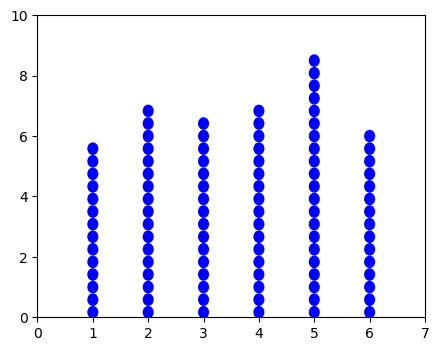

In [3]:
# Next make the animation and render it to the screen
ymax=10
ballwidth=0.2
ballheight=ballwidth*ymax/6*5/4

fig = plt.figure()
fig.set_dpi(100)
fig.set_size_inches(5, 4)

ballstart=((ymax+1)//ballheight)*ballheight

ax = plt.axes(xlim=(0, 7), ylim=(0, ymax))
patches={}
floors={}
    
done=False
def gen():
    frame=0
    while not done:
        yield frame
        frame+=1
        
#pbar = tqdm(total=len(rolls))


        
    
def init():
    patches['activePatch']=0
    #for num,var in enumerate(rolls):
    num=0
    val=rolls[num]
    patch = matplotlib.patches.Ellipse((val, ymax+1), ballwidth, ballheight, fc='b')
    ax.add_patch(patch)
    patches[num]=patch
    for val in range(1,7):
        floors[val]=ballheight
        #print(num,var, patches)

    return []

def animate(i, patches,rolls):
    global done, pbar
    activePatch=patches['activePatch']
    if activePatch not in patches.keys():
        print(extra)
        return []


    x,y=patches[activePatch].get_center()
    if y<=floors[x]:
        floors[x]=floors[x]+ballheight
        patches['activePatch']=activePatch+1
        activePatch+=1
        if activePatch %4 == 0:
            print("*",end="")
        #print(patches.keys())
        #print(activePatch)

        if activePatch not in patches.keys():
            if activePatch<len(rolls):
                val=rolls[activePatch]
                patch = matplotlib.patches.Ellipse((val, ymax+1), ballwidth, ballheight, fc='b')
                ax.add_patch(patch)
                patches[activePatch]=patch



            else:
                print("]",end="")
                done=True
                return []
    
    patch=patches[activePatch]
    x, y = patch.get_center()
    if y>=floors[x]+2*ballheight:
        y =  y-2*ballheight
    else:
        y =  y-ballheight
    patch.set_center((x, y))
    
    return[]


print("["+"="*(len(rolls)//4)+"]")
print("[",end="")
    
anim = animation.FuncAnimation(fig, animate, 
                               init_func=init, 
                               #frames=int((ymax/ballheight/2))*len(G40), 
                               #frames=100,
                               frames=gen,
                               save_count=int((ymax/ballheight/2))*len(rolls), 
                               fargs=(patches,rolls),
                               interval=15,
                               blit=True,repeat=False)


HTML(anim.to_jshtml())

